# Integration of scRNA-seq and spatial proteomics data with DiagVI

In this tutorial, we demonstrate how to train DiagVI, a deep generative model for integrating unpaired multi-modal single-cell data using prior biological knowledge encoded in a guidance graph. We focus on the integration of scRNA-seq and spatial proteomics data. DiagVI is designed to align modalities with different feature spaces and sampling biases, making it particularly well suited for this integration task. A common application of DiagVI is the transfer of biological information such as cell type labels from scRNA-seq datasets to spatial proteomics datasets. This scenario frequently arises because scRNA-seq typically profiles thousands of genes but lacks spatial context, whereas spatial proteomics provides high spatial resolution while measuring only a limited number of protein markers.

We illustrate the workflow using a [10x Genomics demo dataset](https://www.10xgenomics.com/datasets/xenium-protein-ffpe-human-renal-carcinoma) profiling a human renal cell carcinoma sample at both the gene and protein level. To simulate a realistic unpaired integration setting, we artificially decouple the gene and protein measurements by treating them as originating from independent cells. Since the original dataset contains paired measurements, we can quantitatively assess integration performance using the FOSCTTM (Fraction of Samples Closer Than the True Match) metric. Additionally, we evaluate the learned latent embeddings using the [scIB](https://scib-metrics.readthedocs.io/en/stable/) benchmarking framework. Throughout the tutorial, we compare DiagVI against simple PCA- and CCA-based baselines. Finally, we demonstrate how the learned latent representations can be used to transfer cell type labels from scRNA-seq to spatial proteomics data.

Overview of this tutorial:

1. Loading and preprocessing the data
2. Preparing a guidance graph
3. Integrating the data with DiagVI
4. Evaluating the results
5. Transfering cell type labels

```{note}
Running the following cell will install tutorial dependencies on Google Colab and in the currently active environment when running outside of Google Colab.
```

In [ ]:
!pip install --quiet scvi-colab
!pip install --quiet cellmapper
from scvi_colab import install

install()

```{note}
Due to the large size of the dataset used in this tutorial, we rely on `rapids_singlecell` to ensure that computationally intensive analysis steps run in a reasonable amount of time. Without GPU acceleration, steps such as neighborhood graph construction would be very slow. Importantly, DiagVI itself does not depend on `rapids_singlecell`.
```

In [1]:
import os
import tempfile
import warnings

import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import scipy.sparse as sp
import scvi
from cellmapper import CellMapper
from scib_metrics.benchmark import BatchCorrection, Benchmarker, BioConservation
from scvi.external import DIAGVI, cytovi
from scvi.utils import compute_foscttm

try:
    import rapids_singlecell as rsc

    HAS_RSC = True
except ImportError:
    HAS_RSC = False

In [2]:
scvi.settings.seed = 42
print("Last run with scvi-tools version:", scvi.__version__)

Seed set to 42


Last run with scvi-tools version: 1.4.0.post1


In [3]:
warnings.filterwarnings("ignore")
sc.set_figure_params(figsize=(6, 6), frameon=False)

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

## Loading and preprocessing the data

The dataset used in this tutorial is a 10x Xenium in situ gene and protein expression dataset (from https://www.10xgenomics.com/datasets/xenium-protein-ffpe-human-renal-carcinoma) profiling a FFPE human renal cell carcinoma sample. The dataset was originally downloaded from 10x Genomics and processed using the following steps:

- Aggregating protein intensities over the provided cell segmentation masks.
- Basic single-cell preprocessing, including calculation of quality control metrics, filtering of low-quality cells and genes, dimensionality reduction, and clustering.
- Correcting protein intensities by subtracting background offset and applying clipping.
- Hierarchical cell type annotation based on differentially expressed marker genes, protein expression, and Leiden clustering.
- Splitting the dataset into two separate AnnData objects to artificially decouple the gene and protein measurements by treating them as originating from independent cells.

The resulting dataset consists of:

- `adata_rna`: AnnData object containing RNA measurements (395,161 cells × 405 genes)
- `adata_protein`: AnnData object containing protein measurements (395,161 cells × 23 proteins)

As described above, this setup mimics a realistic unpaired integration scenario, allowing us to evaluate DiagVI's ability to align modalities without paired observations and features.

```{note}
You can modify `save_dir` below to change where the data files for this tutorial are saved.
```

In [4]:
save_dir = tempfile.TemporaryDirectory()

In [5]:
# download RNA data
adata_rna_path = os.path.join(save_dir.name, "10x_rcc_rna.h5ad")
adata_rna = sc.read(
    adata_rna_path,
    backup_url="https://ndownloader.figshare.com/files/61982293",
)
adata_rna

  0%|          | 0.00/568M [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 395161 × 405
    obs: 'region', 'slide', 'cell_id', 'area', 'n_genes_by_counts', 'total_counts', 'n_counts', 'pseudo_batch', 'leiden_res_0_5', 'leiden_res_1', 'leiden_res_1_6', 'leiden_res_2', 'annotation_l0', 'annotation_l1', 'annotation_l2'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'annotation_l0_colors', 'annotation_l1_colors', 'annotation_l2_colors', 'leiden_res_0_5', 'leiden_res_0_5_colors', 'leiden_res_1', 'leiden_res_1_6', 'leiden_res_1_6_colors', 'leiden_res_1_colors', 'leiden_res_2', 'leiden_res_2_colors', 'log1p', 'neighbors', 'pca', 'sopa_attrs', 'spatialdata_attrs', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

For count data, such as scRNA-seq data, DiagVI expects a raw count expression matrix as input. Optionally, users can provide experimental covariates (e.g., batch annotations) or other confounding variables and cell label annotations to guide semi-supervised training. The loaded RNA AnnData object conatins the raw count matrix and cell labels, while no experimental covariates or confounding variables are provided. No further preprocessing of the RNA data is required.

In [6]:
# download protein data
adata_protein_path = os.path.join(save_dir.name, "10x_rcc_protein.h5ad")
adata_protein = sc.read(
    adata_protein_path,
    backup_url="https://ndownloader.figshare.com/files/61982290",
)
adata_protein

  0%|          | 0.00/129M [00:00<?, ?B/s]

AnnData object with n_obs × n_vars = 395161 × 23
    obs: 'region', 'slide', 'cell_id', 'area', 'n_genes_by_counts', 'total_counts', 'n_counts', 'pseudo_batch', 'leiden_res_0_5', 'leiden_res_1', 'leiden_res_1_6', 'leiden_res_2', 'annotation_l0', 'annotation_l1', 'annotation_l2'
    uns: 'annotation_l0_colors', 'annotation_l1_colors', 'annotation_l2_colors'
    obsm: 'spatial'
    layers: 'raw'

For continuous data, such as protein intensities, DiagVI expects a transformed (and optionally scaled) expression matrix as input. Optionally, users can provide experimental covariates (e.g., batch annotations) or other confounding variables and cell label annotations. Similar to the RNA AnnData object, the loaded protein AnnData object contains raw protein intensities and cell labels. 

Before training DiagVI, these intensities must be transformed and normalized to make them suitable for modeling. This is required due to antibody-based single-cell measurements being relative. For example, cytometry data are typically transformed using functions such as hyperbolic arcsinh (arcsinh), logicle, or biexponential to compress dynamic range and stabilize variance. Subsequently, the data is usually scaled feature-wise to ensure that marker expression values are on comparable scales across all channels (see for instance Liechti et al., 2021, Nature Immunology, https://doi.org/10.1038/s41590-021-01006-z).

For integration with DiagVI, we recommend a simple two-step preprocessing strategy inspired by [CytoVI](https://docs.scvi-tools.org/en/1.4.1/user_guide/models/cytovi.html) (Ingelfinger et al. 2025, https://www.biorxiv.org/content/10.1101/2025.09.07.674699v1):

1. Arcsinh transformation: Widely used in flow cytometry to stabilize variance and improve comparability across markers. It compresses large dynamic ranges by behaving linearly at low intensities and logarithmically at high intensities.
2. Feature-wise min-max scaling: After transformation, each marker (feature) is rescaled individually to the [0, 1] range to account for differences in brightness across fluorophores or variations in antibody affinities.

CytoVI, available in scvi-tools, provides utility functions for both preprocessing steps: `cytovi.transform_arcsinh()` to apply the arcsinh transformation, and `cytovi.scale()` to perform feature-wise scaling. It also provides a plotting function for visual inspection of marker intensity distributions: `cytovi.plot_histogram`.

We first have a look at the raw protein expression for all markers using histograms.

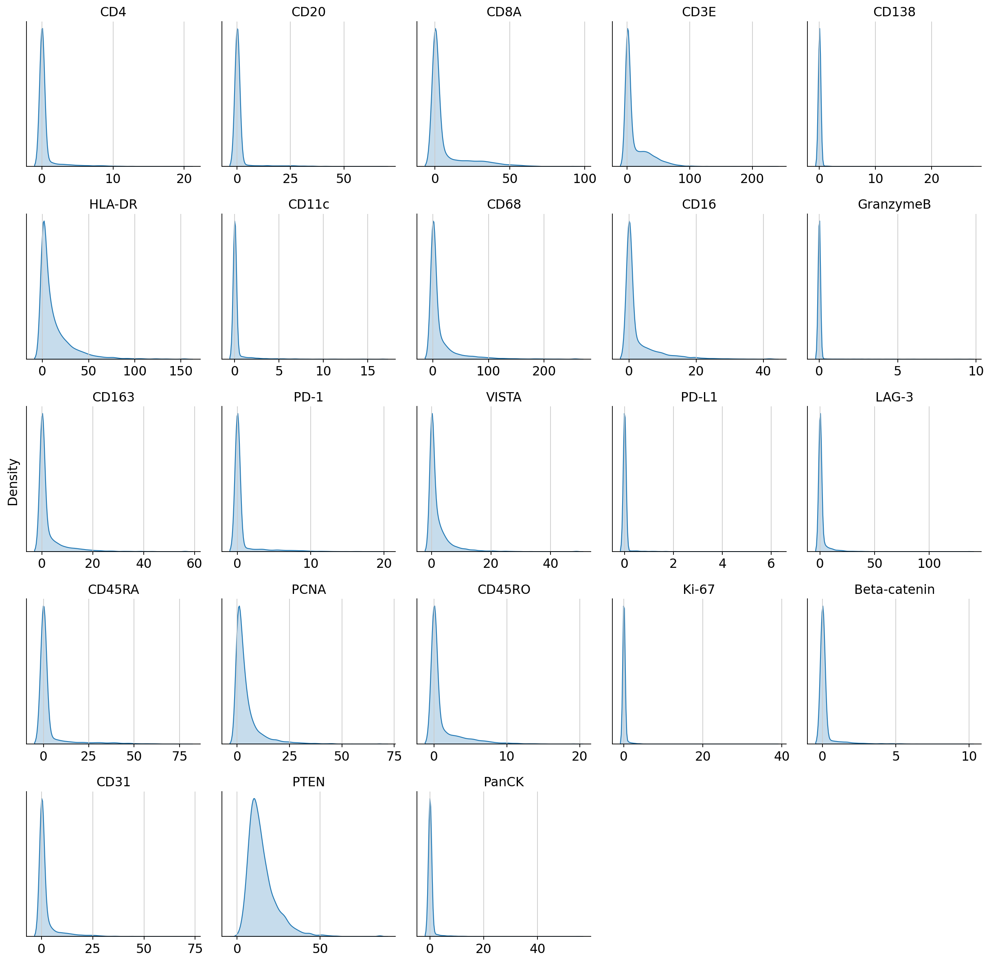

In [7]:
cytovi.plot_histogram(adata_protein)

We can observe that many markers show large dynamic ranges, which we can compress using the arcsinh tranformation. Furthermore, we can observe that expression scales can differ strongly across markers. Therefore, we also apply feature-wise min-max scaling.

In [8]:
# make layer dense for compatibility with cytovi functions
adata_protein.layers["raw"] = adata_protein.layers["raw"].toarray()

# apply arcsinh transformation and min-max scaling
cytovi.transform_arcsinh(adata_protein)
cytovi.scale(adata_protein)

# sparsify layer
adata_protein.layers["scaled"] = sp.csr_matrix(adata_protein.layers["scaled"])

We can now inspect the transformed and scaled protein expression.

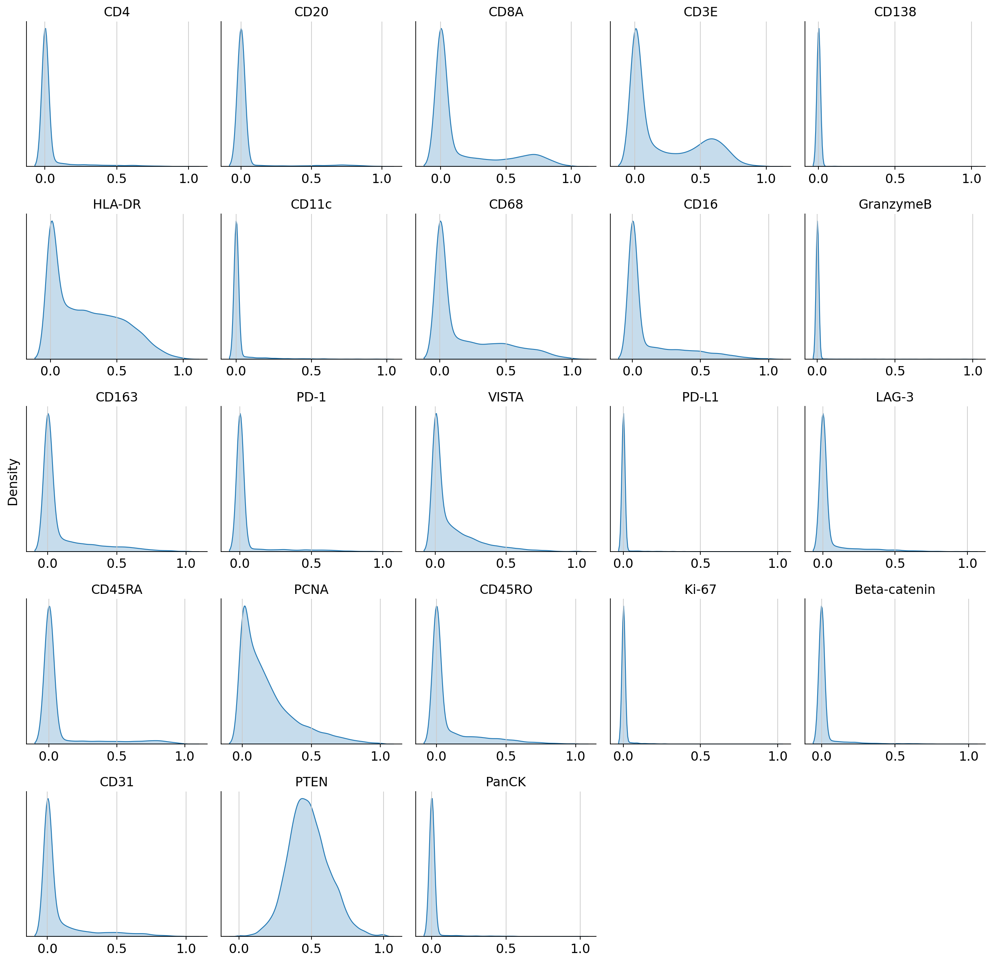

In [9]:
cytovi.plot_histogram(adata_protein, layer_key="scaled")

## Preparing a guidance graph

After loading and preprocessing the data, we proceed to prepare a guidance graph. The guidance graph regularizes feature embeddings to ensure biologically meaningful alignment between modalities. DiagVI supports three ways to specify the guidance graph:

1. Automatic construction: If no graph is provided, DiagVI constructs one from overlapping feature names across modalities (e.g., shared gene symbols).

2. Custom mapping via DataFrame: Useful when feature naming conventions differ (e.g., genes vs. proteins). The DataFrame specifies feature pairs and can include optional weights or signs.

3. Explicit graph specification: For full control, pass a `torch_geometric.data.Data` object directly.

In this tutorial, we use option 2 and create a guidance graph via a custom mapping. We define a map that links protein names in `adata_protein.var_names` to gene names in `adata_rna.var_names` for overlapping features (i.e., proteins and their corresponding genes). Since protein and gene naming conventions often differ (e.g., a gene may be named MS4A1 while the corresponding protein is named CD20), automatic graph construction is not possible in this case. To construct the guidance graph, we use `DIAGVI.construct_custom_guidance_graph()`.

In [10]:
# create a dictionary containing both adata objects and their names
input_dict = {"rna": adata_rna, "protein": adata_protein}

In [11]:
# create a map linking gene names to protein names
gene_protein_map = {
    "CD4": "CD4",
    "MS4A1": "CD20",
    "CD8A": "CD8A",
    "CD3E": "CD3E",
    "SDC1": "CD138",
    "HLA-DRA": "HLA-DR",
    "ITGAX": "CD11c",
    "CD68": "CD68",
    "FCGR3A": "CD16",
    "GZMB": "GranzymeB",
    "CD163": "CD163",
    "PDCD1": "PD-1",
    "VSIR": "VISTA",
    "CD274": "PD-L1",
    "LAG3": "LAG-3",
    "CD45RA": "CD45RA",
    "PCNA": "PCNA",
    "CD45RO": "CD45RO",
    "MKI67": "Ki-67",
    "CTNNB1": "Beta-catenin",
    "PECAM1": "CD31",
    "PTEN": "PTEN",
    "KRT8": "PanCK",
    "KRT18": "PanCK",
    "KRT7": "PanCK",
    "KRT5": "PanCK",
    "KRT6A": "PanCK",
}

```{note}
Column names in the mapping DataFrame must match names in `input_dict`!
```

In [12]:
# create a DataFrame from the mapping
correspondence = pd.DataFrame(gene_protein_map.items(), columns=["rna", "protein"])
correspondence.head()

,rna,protein
0,CD4,CD4
1,MS4A1,CD20
2,CD8A,CD8A
3,CD3E,CD3E
4,SDC1,CD138


In [13]:
# construct the guidance graph using option 2: custom mapping via DataFrame
guidance_graph = DIAGVI.construct_custom_guidance_graph(input_dict, correspondence)

## Integrating the data with DiagVI

After loading and preprocessing the data, and after preparing the guidance graph, we can proceed with integrating the data using DiagVI. Running DiagVI involves three main steps: registering the AnnData objects, creating a DIAGVI model instance, and training the model.

During registration, we can specify modality-specific parameters that influence how DiagVI processes each dataset. For example, we can define which data layers to use and indicate where batch annotations are stored. We can also configure whether to run DiagVI in a semi-supervised setting by providing cell type labels if available, and whether to use a simple Gaussian prior or a more flexible Gaussian mixture model (GMM) with $L$ components as the prior on the cell latent variables. When cell type labels are provided, $L$ is set to the number of unique labels.

Another important parameter is `likelihood`, which determines the generative likelihood used for each modality. For count data such as scRNA-seq, we recommend using the negative binomial likelihood (`"nb"`). For transformed and scaled protein intensities, we recommend using the normal likelihood (`"normal"`). In the latter case, `normalize_lib=False` must also be set to prevent DiagVI from applying library size normalization to protein intensities. For more details on likelihood choices and library size normalization, see the DiagVI user guide in the [scvi-tools documentation](https://docs.scvi-tools.org/en/stable/).

In this tutorial, we model raw gene counts using a negative binomial likelihood and transformed, scaled protein intensities using a normal likelihood. For the RNA modality, we additionally provide cell type labels, enabling the training of a classifier that predicts cell types from the latent embeddings. To mimic a realistic label transfer scenario where annotations are available for scRNA-seq data but not for spatial proteomics data, we do not provide labels for the protein modality. By `setting gmm_prior=True`, we further enable a Gaussian mixture prior for both modalities. We register each AnnData object separately, however, setting up MuData objects is also possible using `DIAGVI.setup_mudata()`.

In [14]:
# register rna data
DIAGVI.setup_anndata(
    adata_rna,
    layer="counts",
    labels_key="annotation_l2",
    likelihood="nb",
    gmm_prior=True,
)

# register protein data
DIAGVI.setup_anndata(
    adata_protein,
    layer="scaled",
    likelihood="normal",
    normalize_lib=False,
    gmm_prior=True,
)

To initialize the DiagVI model, we provide an input dictionary that maps modality names to their corresponding AnnData objects, along with the guidance graph in our case. Alternatively, the model can be initialized directly from a MuData object and, as described above, it is also possible to omit the guidance graph if automatic construction is desired.

Because DiagVI can be applied to a wide range of integration tasks, there is no single latent dimensionality that is optimal in all cases. We therefore explicitly set a non-default value for the latent dimension. Based on our observations, latent space dimensions in the range of 10 to 20 typically yield strong performance in terms of modality alignment and biological conservation when integrating scRNA-seq data with spatial proteomics data. Similar findings were reported by Ingelfinger et al. (2025, CytoVI; https://www.biorxiv.org/content/10.1101/2025.09.07.674699v1). We therefore recommend choosing a latent dimension between 10 and 20 based on the number of profiled protein markers. For this dataset, we use `n_latent=20`.

In [15]:
model = DIAGVI(
    adatas=input_dict,
    guidance_graph=guidance_graph,
    n_latent=20,
)

INFO     Guidance graph consistency checks passed.                                                                 
INFO     DiagVI Model with the following params: input names: ['rna', 'protein'], n_inputs: {'rna': 405, 'protein':
         23}, n_batches: {'rna': 1, 'protein': 1}, n_labels: {'rna': 13, 'protein': 1}, semi_supervised: {'rna':   
         True, 'protein': False}, gmm_priors: {'rna': True, 'protein': True}, generative distributions: {'rna':    
         'nb', 'protein': 'normal'}, n_latent: 20.                                                                 


We can now train DiagVI, which typically completes within a few minutes on a GPU. While the default hyperparameters provide a solid starting point, optimal performance often benefits from tuning. For more information on hyperparameters and tuning, see the DiagVI user guide in the [scvi-tools documentation](https://docs.scvi-tools.org/en/stable/). For this larger dataset, we additionally set a non-default `batch_size` to accelerate training.

In [16]:
model.train(max_epochs=50, batch_size=2048)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
You are using a CUDA device ('NVIDIA GeForce RTX 4090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/50 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 10 records. Best score: 32.704. Signaling Trainer to stop.


Once training is complete, we can extract the learned latent representations for each cell.

In [17]:
# add latent embeddings to AnnData objects
DIAGVI_LATENT_KEY = "X_diagvi"
latents = model.get_latent_representation()

adata_rna.obsm[DIAGVI_LATENT_KEY] = latents["rna"]
adata_protein.obsm[DIAGVI_LATENT_KEY] = latents["protein"]

## Evaluating the results

### Integrating the data with PCA and CCA

To evaluate the learned embeddings, we construct joint PCA and CCA baselines using [CellMapper](https://cellmapper.readthedocs.io/), a toolkit for cross-modal cell mapping and evaluation. We first subset both modalities to overlapping features (genes and corresponding proteins), preprocess and scale each modality, and then compute 20-dimensional joint PCA and CCA embeddings. Finally, we concatenate the two AnnData objects for downstream evaluation and visualization.

```{note}
If your goal is only to visualize DiagVI’s learned latent embeddings on your own data, you can simply concatenate the AnnData objects containing the latent embeddings. You do not need to select overlapping features or preprocess them as shown in the next two cells, which are only required for computing baseline embeddings.
```

In [18]:
# extract mapping
rna_genes = list(gene_protein_map.keys())
protein_markers = list(gene_protein_map.values())

# subset AnnDatas to overlapping features
adata_rna_sub = adata_rna[:, rna_genes].copy()
adata_protein_sub = adata_protein[:, protein_markers].copy()
adata_protein_sub.var_names = rna_genes

# RNA preprocessing
adata_rna_sub.X = adata_rna_sub.layers["counts"].copy()
sc.pp.normalize_total(adata_rna_sub)
sc.pp.log1p(adata_rna_sub)
sc.pp.scale(adata_rna_sub)

# protein preprocessing
cytovi.scale(adata_protein_sub, method="standard")
adata_protein_sub.X = adata_protein_sub.layers["scaled"].copy()

In [19]:
# initialize CellMapper
cmap = CellMapper(query=adata_protein_sub, reference=adata_rna_sub)

# compute joint PCA and CCA
PCA_LATENT_KEY = "X_joint_pca"
CCA_LATENT_KEY = "X_cca"
cmap.compute_joint_pca(n_comps=20, key_added=PCA_LATENT_KEY)
cmap.compute_fast_cca(n_comps=20, key_added=CCA_LATENT_KEY)

INFO     Initialized CellMapper with 395161 query cells and 395161 reference cells.                                
INFO     Embedding computed with method 'joint_pca' stored as 'X_joint_pca' in both reference.obsm and query.obsm. 
INFO     Computing fast CCA between query (395161 cells) and reference (395161 cells).                             
INFO     Using 27 common genes between query and reference datasets.                                               
INFO     SVD of cross-covariance matrix computed successfully.                                                     
INFO     Embedding computed with method 'fast_cca' stored as 'X_cca' in both reference.obsm and query.obsm.        


In [20]:
# create a combined AnnData
adata_combined = sc.concat(
    [adata_rna_sub, adata_protein_sub],
    axis=0,
    join="inner",
    label="modality",
    keys=["rna", "protein"],
)
adata_combined.uns["annotation_l1_colors"] = adata_rna_sub.uns["annotation_l1_colors"]
adata_combined.uns["annotation_l2_colors"] = adata_rna_sub.uns["annotation_l2_colors"]

### Qualitative evaluation

We can now visualize the cellular representations of the two baseline embeddings and of DiagVI using UMAP to assess how well the two modalities align and whether biologically meaningful structure is preserved in the shared latent space.

In [21]:
colors = ["modality", "annotation_l2"]

... storing 'cell_id' as categorical


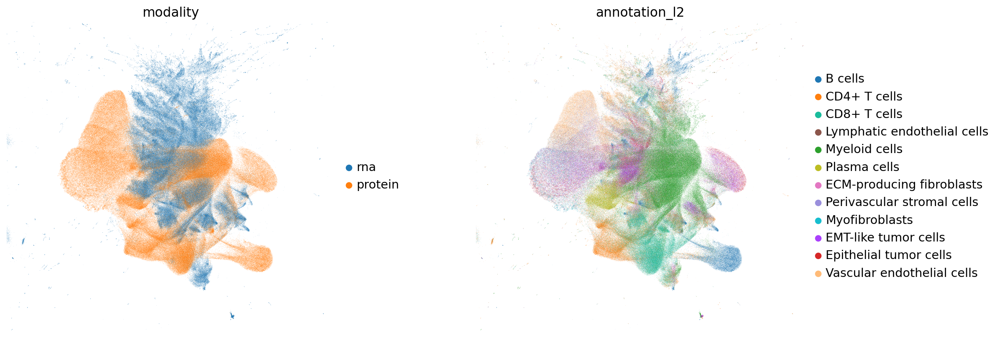

In [22]:
# compute neighbors and UMAP
PCA_UMAP_KEY = "X_umap_joint_pca"
if HAS_RSC:
    rsc.pp.neighbors(adata_combined, use_rep=PCA_LATENT_KEY, metric="cosine")
    rsc.tl.umap(adata_combined, key_added=PCA_UMAP_KEY)
else:
    sc.pp.neighbors(adata_combined, use_rep=PCA_LATENT_KEY, metric="cosine")
    sc.tl.umap(adata_combined, key_added=PCA_UMAP_KEY)

# plot latent embeddings colored by modality and cell type
fig = sc.pl.embedding(
    adata_combined,
    basis=PCA_UMAP_KEY,
    color=colors,
    wspace=0.3,
    return_fig=True,
    show=False,
)
for ax in fig.axes[: len(colors)]:
    ax.set_xlim(-20, 20)
    ax.set_ylim(-20, 20)
plt.show()

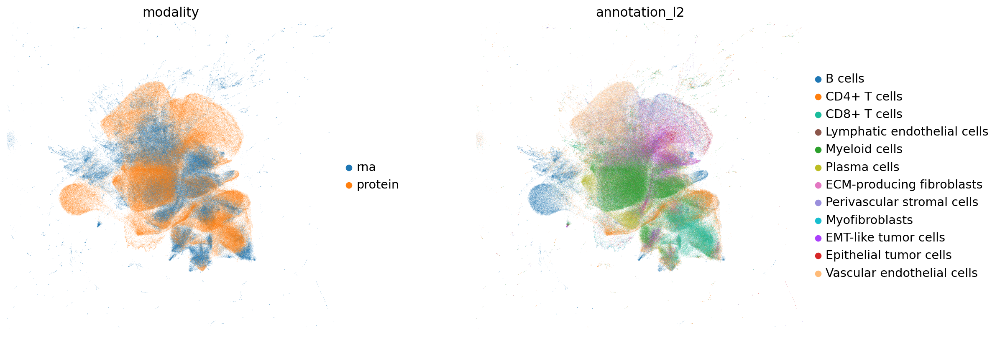

In [23]:
# compute neighbors and UMAP
CCA_UMAP_KEY = "X_umap_cca"
if HAS_RSC:
    rsc.pp.neighbors(adata_combined, use_rep=CCA_LATENT_KEY, metric="cosine")
    rsc.tl.umap(adata_combined, key_added=CCA_UMAP_KEY)
else:
    sc.pp.neighbors(adata_combined, use_rep=CCA_LATENT_KEY, metric="cosine")
    sc.tl.umap(adata_combined, key_added=CCA_UMAP_KEY)

# plot latent embeddings colored by modality and cell type
fig = sc.pl.embedding(
    adata_combined,
    basis=CCA_UMAP_KEY,
    color=colors,
    wspace=0.3,
    return_fig=True,
    show=False,
)
for ax in fig.axes[: len(colors)]:
    ax.set_xlim(-20, 20)
    ax.set_ylim(-20, 20)
plt.show()

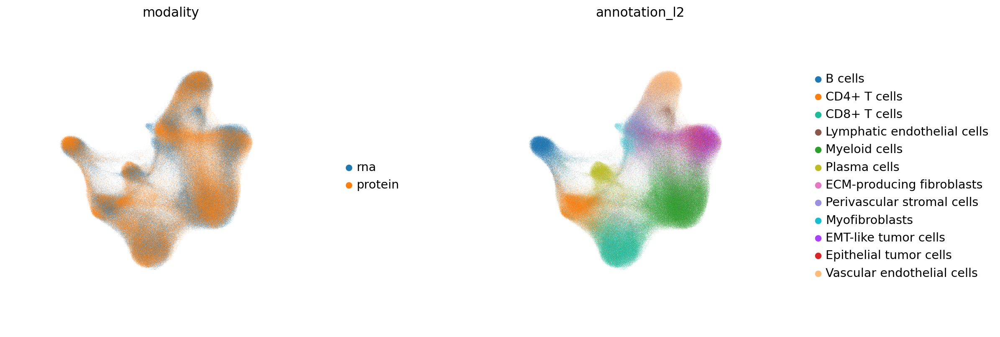

In [24]:
# compute neighbors and UMAP
DIAGVI_UMAP_KEY = "X_umap_diagvi"
if HAS_RSC:
    rsc.pp.neighbors(adata_combined, use_rep=DIAGVI_LATENT_KEY, metric="cosine")
    rsc.tl.umap(adata_combined, key_added=DIAGVI_UMAP_KEY)
else:
    sc.pp.neighbors(adata_combined, use_rep=DIAGVI_LATENT_KEY, metric="cosine")
    sc.tl.umap(adata_combined, key_added=DIAGVI_UMAP_KEY)

# plot latent embeddings colored by modality and cell type
fig = sc.pl.embedding(
    adata_combined,
    basis=DIAGVI_UMAP_KEY,
    color=colors,
    wspace=0.3,
    return_fig=True,
    show=False,
)
for ax in fig.axes[: len(colors)]:
    ax.set_xlim(-20, 20)
    ax.set_ylim(-20, 20)
plt.show()

The latent embeddings from both modalities are well aligned in DiagVI’s latent space, but not in the joint PCA or CCA embeddings, where strong outliers required cropping the plots for better visualization. Cell types, particularly immune populations, form coherent and well-defined clusters across modalities in DiagVI’s latent space. Some cell types, such as tumor and stromal subpopulations, are not clearly separable, reflecting substantial transcriptional and proteomic similarity between these states in our data. Indeed, these subpopulations were difficult to distinguish during annotation. In contrast, the PCA and CCA embeddings show little to no clear clustering.

For the protein modality, clusters appear less distinct compared to the RNA modality. This is expected, as only 23 proteins are measured, capturing substantially less cellular heterogeneity than the more than 400 genes profiled in the RNA modality.

### Quantitative evaluation

In addition to visual inspection, we can quantitatively evaluate the embeddings using the FOSCTTM metric and the [scIB](https://scib-metrics.readthedocs.io/en/stable/) benchmarking framework.

FOSCTTM measures how close truly paired cells are in the shared embedding space. Lower values indicate better alignment, as correctly paired cells rank closer to each other among all possible cross-modal matches. To assess DiagVI’s generalizability, we restrict the evaluation to the cells held out for validation during training and compute the metric on this subset for all embeddings.

In [25]:
# get validation indices
validation_indices = model.validation_indices

In [26]:
# FOSCTTM PCA
pca_embeddings = {
    "rna": adata_rna_sub.obsm[PCA_LATENT_KEY],
    "protein": adata_protein_sub.obsm[PCA_LATENT_KEY],
}
foscttm_results_pca = compute_foscttm(pca_embeddings, validation_indices, downsample=True)

# FOSCTTM CCA
cca_embeddings = {
    "rna": adata_rna_sub.obsm[CCA_LATENT_KEY],
    "protein": adata_protein_sub.obsm[CCA_LATENT_KEY],
}
foscttm_results_cca = compute_foscttm(cca_embeddings, validation_indices, downsample=True)

# FOSCTTM DiagVI
foscttm_results_diagvi = compute_foscttm(latents, validation_indices, downsample=True)

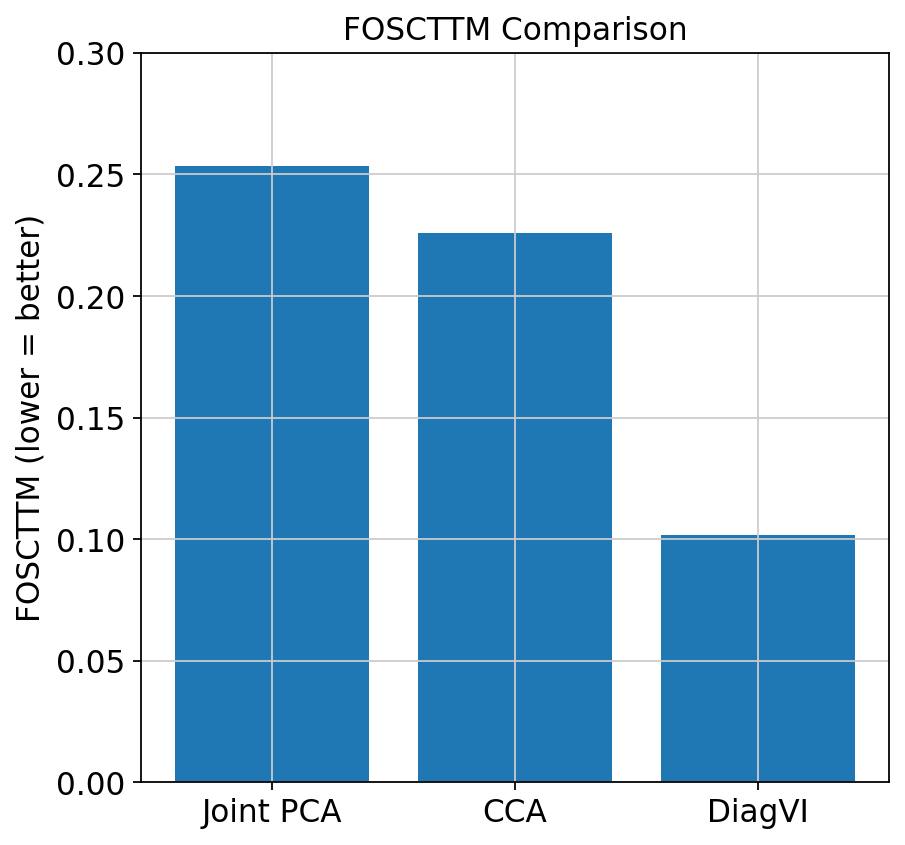

In [27]:
# extract and plot FOSCTTM means
foscttm_pca = foscttm_results_pca["foscttm/mean"]
foscctm_cca = foscttm_results_cca["foscttm/mean"]
foscttm_diagvi = foscttm_results_diagvi["foscttm/mean"]

methods = ["Joint PCA", "CCA", "DiagVI"]
scores = [foscttm_pca, foscctm_cca, foscttm_diagvi]

plt.figure()
plt.bar(methods, scores)
plt.ylabel("FOSCTTM (lower = better)")
plt.title("FOSCTTM Comparison")
plt.ylim(0, 0.3)
plt.show()

The FOSCTTM results show that DiagVI achieves substantially better alignment of paired cells compared to the baselines. While the joint PCA and CCA embeddings yield mean FOSCTTM scores of 0.25 and 0.23, respectively, DiagVI reduces this score to 0.10, indicating that truly paired cells are much closer in the shared latent space. This demonstrates that DiagVI effectively aligns modalities while preserving the correspondence between matched cells.

To further evaluate the integration performance, we use the [scIB-metrics](https://scib-metrics.readthedocs.io/en/stable/) package, which provides a comprehensive set of metrics to assess how well embeddings remove batch effects (or, in our case, align modalities) while preserving biologically meaningful structure.

Given the large size of our dataset, we first subsample the data to 10,000 cells per modality using `cytovi.subsample()`. This substantially reduces runtime while still providing a reliable estimate of integration quality.

In [28]:
# first make observation names unique
adata_combined.obs_names_make_unique()

# then subsample grouped by modality
adata_combined_sub = cytovi.subsample(adata_combined, n_obs=20000, groupby="modality")

We exclude the PCR comparison metric from the benchmark. This metric quantifies how much batch variance is removed relative to an unintegrated baseline, which is well-defined for single-modality batch correction (where all cells share the same feature space) but not for multi-modal integration with non-overlapping features. The remaining batch correction metrics, alongside the FOSCTTM metric, still provide a comprehensive evaluation of modality alignment.

In [29]:
batchcors = BatchCorrection(pcr_comparison=False)

bm = Benchmarker(
    adata_combined_sub,
    batch_key="modality",
    label_key="annotation_l2",
    embedding_obsm_keys=[PCA_LATENT_KEY, CCA_LATENT_KEY, DIAGVI_LATENT_KEY],
    bio_conservation_metrics=BioConservation(),
    batch_correction_metrics=batchcors,
    n_jobs=-1,
)
bm.benchmark()

Embeddings:   0%|          | 0/3 [00:00<?, ?it/s]2026-02-22 12:17:14 | [INFO] isolated labels: no more than 2 batches per label
INFO:2026-02-22 12:17:14,980:jax._src.xla_bridge:812: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2026-02-22 12:17:14 | [INFO] Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2026-02-22 12:17:14 | [WARNING] An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
Embeddings: 100%|██████████| 3/3 [01:41<00:00, 33.97s/it]


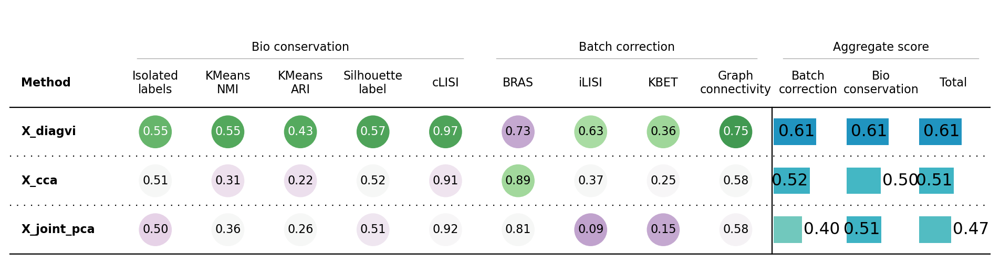

In [30]:
bm.plot_results_table(min_max_scale=False)

The scIB results show that DiagVI outperforms the PCA and CCA baselines in both modality alignment and biological conservation. For batch correction, key metrics like iLISI, kBET, and graph connectivity are much higher for DiagVI, indicating that RNA and protein cells mix well in the latent space. At the same time, biological structure is preserved, with higher KMeans NMI, ARI, and silhouette scores, showing that cell types remain well separated. Overall, DiagVI provides the best balance between aligning modalities and maintaining biological signal.

## Transfering cell type labels

DiagVI’s latent embeddings can be used to transfer cell type labels from scRNA-seq to spatial proteomics data. scRNA-seq captures high cellular heterogeneity across many features, while spatial proteomics provides high spatial resolution. By mapping the protein cells into DiagVI’s shared latent space, we can transfer the more confident RNA annotations to the protein modality. For this, we again use [CellMapper](https://cellmapper.readthedocs.io/).

In [31]:
# set up CellMapper and transfer labels
cmap = CellMapper(query=adata_protein, reference=adata_rna)
cmap.compute_neighbors(use_rep=DIAGVI_LATENT_KEY, knn_method="rapids")
cmap.compute_mapping_matrix()
cmap.map_obs("annotation_l2")

INFO     Initialized CellMapper with 395161 query cells and 395161 reference cells.                                
INFO     Using rapids to compute 30 neighbors.                                                                     
INFO     Computing mapping matrix using kernel method 'gauss'.                                                     
WARNING  Square matrix detected but is_self_mapping=False. Consider setting is_self_mapping=True for matrix powers.
INFO     Mapping categorical data for key 'annotation_l2' using direct multiplication.                             
INFO     Categorical data mapped and stored in query.obs['annotation_l2_pred'].                                    


In [32]:
# evaluate label transfer performance
cmap.evaluate_label_transfer(label_key="annotation_l2")

INFO     Accuracy: 0.6366, Precision: 0.6273, Recall: 0.6366, Weighted F1-Score: 0.6313, Macro F1-Score: 0.5111,   
         Excluded Fraction: 0.0000                                                                                 


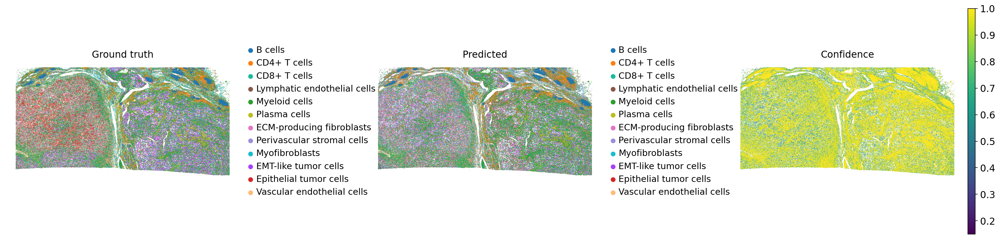

In [33]:
# visualize the original / transferred labels and confidence scores
sc.pl.spatial(
    adata_protein,
    spot_size=2,
    color=["annotation_l2", "annotation_l2_pred", "annotation_l2_conf"],
    title=["Ground truth", "Predicted", "Confidence"],
    ncols=3,
    size=10,
    wspace=0.4,
)

Comparing the ground truth and predicted labels, DiagVI effectively recapitulates the overall tissue structure. Immune cell populations are well-defined and coherent in the predictions, closely matching the ground truth. EMT-like and epithelial tumor cells, for instance, are not clearly separated, consistent with their overlap in DiagVI’s latent space.

Because DiagVI cannot clearly distinguish tumor and stromal subpopulations due to their transcriptional and proteomic similarity, we also perform label transfer at a higher hierarchical level, grouping these subpopulations together.

In [34]:
# set up CellMapper and transfer labels
cmap = CellMapper(query=adata_protein, reference=adata_rna)
cmap.compute_neighbors(use_rep=DIAGVI_LATENT_KEY, knn_method="rapids")
cmap.compute_mapping_matrix()
cmap.map_obs("annotation_l1")

INFO     Initialized CellMapper with 395161 query cells and 395161 reference cells.                                
INFO     Using rapids to compute 30 neighbors.                                                                     
INFO     Computing mapping matrix using kernel method 'gauss'.                                                     
WARNING  Square matrix detected but is_self_mapping=False. Consider setting is_self_mapping=True for matrix powers.
INFO     Mapping categorical data for key 'annotation_l1' using direct multiplication.                             
INFO     Categorical data mapped and stored in query.obs['annotation_l1_pred'].                                    


In [35]:
# evaluate label transfer performance
cmap.evaluate_label_transfer(label_key="annotation_l1")

INFO     Accuracy: 0.7094, Precision: 0.7055, Recall: 0.7094, Weighted F1-Score: 0.7069, Macro F1-Score: 0.6653,   
         Excluded Fraction: 0.0000                                                                                 


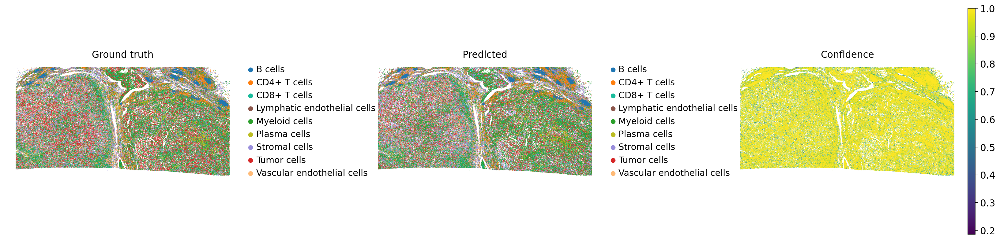

In [36]:
# visualize the original / transferred labels and confidence scores
sc.pl.spatial(
    adata_protein,
    spot_size=2,
    color=["annotation_l1", "annotation_l1_pred", "annotation_l1_conf"],
    title=["Ground truth", "Predicted", "Confidence"],
    ncols=3,
    size=10,
    wspace=0.4,
)

We can now see improved label transfer performance at this higher hierarchical level, reflecting that the confidence in transferred cell labels aligns with the quality and reliability of the original cell type annotations.